### Acrobot simulator with policy gradient method

#### Acrobot simulator

In [1]:
import random
from collections import deque
import numpy as np
import sympy
import control
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [2]:

class Acrobot:
    def __init__(self, 
                 dt=0.02,
                 m1=1.0, m2=1.0,    # アクロボットの各アーム重量
                 l1=1.0, l2=1.0,    # アクロボットの各アーム長
                 lc1=0.5, lc2=0.5,  # アクロボットの各アーム重心位置
                 I1=1.0, I2=1.0,    # アクロボットの各アーム慣性モーメント
                 g=9.8,             # 重力加速度
                 max_torque=3.0,    # 最大トルク
                 train=True,  # 報酬倍率
                angle_rwd_wight = 0.8, # 高さペナルティ
                rad_rwd_wight    = 1, # 角速度ペナルティ
                 max_steps=500):
        #　変数
        self.dt = dt
        self.m1 = m1
        self.m2 = m2
        self.l1 = l1
        self.l2 = l2
        self.lc1 = lc1
        self.lc2 = lc2
        self.I1 = I1
        self.I2 = I2
        self.g = g
        self.max_torque = max_torque
        self.max_steps = max_steps
        self.train = train
        self.angle_rwd_wight=angle_rwd_wight
        self.rad_rwd_wight=rad_rwd_wight
        # 状態は角度と角速度 [q1, q2, dq1, dq2]
        self.state = None
        self.steps = 0

    #初期状態の指定
    def reset(self, initial_state = np.array([-np.pi / 2, 0., 0., 0.])):
        self.state = initial_state
        self.steps = 0
        return self._get_obs()

    def _get_obs(self):
        return self.state.astype(np.float32)

    def _get_height(self, q1, q2):
        y1 = self.l1 * np.sin(q1)           # アクロボット関節位置
        y2 = y1 + self.l2 * np.sin(q1 + q2) # アクロボット先端位置
        return y2
    
    def _get_pos(self, q1, q2):
        x1 = self.l1 * np.cos(q1)
        y1 = self.l1 * np.sin(q1)
        x2 = x1 + self.l2 * np.cos(q1 + q2)
        y2 = y1 + self.l2 * np.sin(q1 + q2)
        return (0, x1, x2), (0, y1, y2)
    
    def step(self, action): 
        # action は -1~1 を想定 -> 実際のトルクにスケーリング
        torque = np.clip(action, -1.0, 1.0) * self.max_torque

        q1, q2, dq1, dq2 = self.state

        # 運動方程式を計算 
        ddq1, ddq2 = self.dynamics(q1, q2, dq1, dq2, torque)

        # オイラー前進
        dq1 += ddq1 * self.dt
        dq2 += ddq2 * self.dt
        q1 += dq1 * self.dt
        q2 += dq2 * self.dt

        # 角度を -pi ~ pi に正規化
        q1 = self._wrap_angle(q1)
        q2 = self._wrap_angle(q2)

        self.state = np.array([q1, q2, dq1, dq2], dtype=np.float32)
        self.steps += 1

        # 報酬と終了判定
        done = False
        reward =  -self.angle_rwd_wight*(self.l1+self.l2-self._get_height(q1, q2))
        
        if self.l1+self.l2-self._get_height(q1, q2) < 0.3:
            reward -= self.rad_rwd_wight*(dq1**2 + dq2**2)
            if (dq1**2 + dq2**2) < 0.1:
                reward = 100.0
                done = True
            
        if self.steps >= self.max_steps:
            done = True

        return self._get_obs(), reward, done, {}

    def dynamics(self, q1, q2, dq1, dq2, torque):
        """
        Acrobot の運動方程式を計算して各加速度を返す
        """
        tau = np.array([0, torque.item()])
        
        m1, m2 = self.m1, self.m2
        l1, l2 = self.l1, self.l2
        lc1, lc2 = self.lc1, self.lc2
        I1, I2 = self.I1, self.I2
        g = self.g
        
        # 質量行列 M(q)
        M11 = I1 + I2 + m1 * lc1**2 + m2 * (l1**2 + lc2**2 + 2 * l1 * lc2 * np.cos(q2))
        M12 = I2 + m2 * (lc2**2 + l1 * lc2 * np.cos(q2))
        M21 = M12
        M22 = I2 + m2 * lc2**2
        M = np.array([[M11, M12], [M21, M22]])
        
        # コリオリ項と遠心力項 C(q, dq)
        C1 = -m2 * l1 * lc2 * np.sin(q2) * (2 * dq1 + dq2)* dq2
        C2 = m2 * l1 * lc2 * np.sin(q2) * dq1 ** 2
        C = np.array([C1, C2])
        
        # 重力項 G(q)
        G1 = (m1 * lc1 + m2 * l1) * g * np.cos(q1) + m2 * lc2 * g * np.cos(q1 + q2)
        G2 = m2 * lc2 * g * np.cos(q1 + q2)
        G = np.array([G1, G2])

        #角加速度
        ddq = np.linalg.solve(M, tau - C - G)

        return ddq[0], ddq[1]

    def _wrap_angle(self, angle):
        return ((angle + np.pi) % (2 * np.pi)) - np.pi
    
    def LQR_gain(self):
        """"
            return LQR gain K 
            
            optimal control u = -K(x - x_object)
            
            x_object = [pi/2, 0, 0, 0]
        """
        q1, q2 = sympy.symbols('q1 q2', real=True)
        dq1, dq2 = sympy.symbols('dq1 dq2', real=True)
        tau = sympy.symbols('tau', real=True)

        m1, m2 = sympy.symbols('m1 m2', positive=True)
        l1, l2 = sympy.symbols('l1 l2', positive=True)
        lc1, lc2 = sympy.symbols('lc1 lc2', positive=True)
        I1, I2 = sympy.symbols('I1 I2', positive=True)
        g = sympy.Symbol('g', positive=True)


        M11 = I1 + I2 + m1 * lc1**2 + m2 * (l1**2 + lc2**2 + 2 * l1 * lc2 * sympy.cos(q2))
        M12 = I2 + m2 * (lc2**2 + l1 * lc2 * sympy.cos(q2))
        M21 = M12
        M22 = I2 + m2 * lc2**2

        # コリオリ項と遠心力項 C(q, dq)
        C1 = -m2 * l1 * lc2 * sympy.sin(q2) * (2 * dq1 + dq2)* dq2
        C2 = m2 * l1 * lc2 * sympy.sin(q2) * dq1 ** 2

        # 重力項 G(q)
        G1 = (m1 * lc1 + m2 * l1) * g * sympy.cos(q1) + m2 * lc2 * g * sympy.cos(q1 + q2)
        G2 = m2 * lc2 * g * sympy.cos(q1 + q2)

        eq1 = M11*sympy.Symbol('ddq1', real=True) + M12*sympy.Symbol('ddq2', real=True) + C1 + G1 + 0
        eq2 = M21*sympy.Symbol('ddq1', real=True) + M22*sympy.Symbol('ddq2', real=True) + C2 + G2 - tau

        ddq1, ddq2 = sympy.symbols('ddq1 ddq2', real=True)

        solutions = sympy.solve([eq1, eq2], [ddq1, ddq2], dict=True)

        ddq1_expr = solutions[0][ddq1]
        ddq2_expr = solutions[0][ddq2]

        f = sympy.Matrix([
            dq1,
            dq2,
            ddq1_expr,
            ddq2_expr
        ])

        # x = [q1, q2, dq1, dq2],  u = tau
        x_vec = sympy.Matrix([q1, q2, dq1, dq2])
        u_vec = sympy.Matrix([tau])

        # A = df/dx,  B = df/du
        A_sym = f.jacobian(x_vec)
        B_sym = f.jacobian(u_vec)

        subs_point = {
            q1: sympy.pi/2,
            q2: 0.0,
            dq1: 0.0,
            dq2: 0.0,
            tau: 0.0,
            # パラメータの実数値例
            m1: 1.0,
            m2: 1.0,
            l1: 1.0,
            l2: 1.0,
            lc1: 0.5,
            lc2: 0.5,
            I1: 1.0,
            I2: 1.0,
            g: 9.81
        }

        A_mat = A_sym.subs(subs_point)
        B_mat = B_sym.subs(subs_point)

        # sympyオブジェクトをnumpy配列に変換
        A_lin = np.array(A_mat, dtype=float)
        B_lin = np.array(B_mat, dtype=float)

        # ---------------------------
        # 5. LQR の計算 (Python-Control)
        # ---------------------------
        # コスト J = ∫ ( x^T Q x + u^T R u ) dt
        # x: 4次元, u: 1次元
        Q = np.diag([10.0, 10.0, 1.0, 1.0])  # 例
        R = np.array([[0.1]])               # 例

        # 連続時間LQRを計算
        K, S, E = control.lqr(A_lin, B_lin, Q, R)
        
        return K

In [3]:
# Actor ネットワーク
class Actor(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256, action_limit=1.0):
        super(Actor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, action_dim),
            nn.Tanh()  # アクションを -1~1 に収める
        )
        self.action_limit = action_limit

    def forward(self, x):
        a = self.net(x)
        return a * self.action_limit


# Critic ネットワーク (Q関数)
class Critic(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=256):
        super(Critic, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim + action_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, s, a):
        x = torch.cat([s, a], dim=-1)
        q = self.net(x)
        return q


# リプレイバッファ
class ReplayBuffer:
    def __init__(self, max_size=100000):
        self.buffer = deque(maxlen=max_size)

    def push(self, s, a, r, s_next, done):
        self.buffer.append((s, a, r, s_next, done))

    def sample(self, batch_size=64):
        batch = random.sample(self.buffer, batch_size)
        s, a, r, s_next, d = zip(*batch)
        return (np.array(s, dtype=np.float32),
                np.array(a, dtype=np.float32),
                np.array(r, dtype=np.float32),
                np.array(s_next, dtype=np.float32),
                np.array(d, dtype=np.float32))

    def __len__(self):
        return len(self.buffer)




In [4]:
class DDPGAgent:
    def __init__(self, 
                 state_dim, 
                 action_dim, 
                 actor_lr=1e-3, 
                 critic_lr=1e-3, 
                 gamma=0.99, 
                 tau=0.005,
                 action_limit=1.0,
                 buffer_size=100000,
                 batch_size=64):

        self.gamma = gamma
        self.tau = tau
        self.batch_size = batch_size
        self.action_limit = action_limit

        # ネットワーク
        self.actor = Actor(state_dim, action_dim, action_limit=action_limit)
        self.critic = Critic(state_dim, action_dim)
        self.actor_target = Actor(state_dim, action_dim, action_limit=action_limit)
        self.critic_target = Critic(state_dim, action_dim)

        # ターゲットネットワークの初期化 (同じ重みで始める)
        self.actor_target.load_state_dict(self.actor.state_dict())
        self.critic_target.load_state_dict(self.critic.state_dict())

        # オプティマイザ
        self.actor_optimizer = optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.critic_optimizer = optim.Adam(self.critic.parameters(), lr=critic_lr)

        # リプレイバッファ
        self.replay_buffer = ReplayBuffer(max_size=buffer_size)

    def get_action(self, state, noise_scale=0.1, train=True):
        """
        Actor からアクションを取得し、探索ノイズを追加
        """
        state_t = torch.FloatTensor(state).unsqueeze(0)
        with torch.no_grad():
            action = self.actor(state_t).cpu().numpy()[0]
        # ガウスノイズを加える (オフポリシー学習のための行動探索)
        if train:
            action += noise_scale * np.random.randn(len(action))
        action = np.clip(action, -self.action_limit, self.action_limit)
        return action

    def load_trained_model(self, actor_path, critic_path):
        self.actor.load_state_dict(torch.load(actor_path,map_location=torch.device('cpu')))
        self.actor_target.load_state_dict(torch.load(actor_path,map_location=torch.device('cpu')))
        self.critic.load_state_dict(torch.load(critic_path,map_location=torch.device('cpu')))
        self.critic_target.load_state_dict(torch.load(critic_path,map_location=torch.device('cpu')))
    
    def update(self):
        """
        リプレイバッファからサンプリングして Actor / Critic を学習
        """
        if len(self.replay_buffer) < self.batch_size:
            return

        s, a, r, s_next, d = self.replay_buffer.sample(self.batch_size)
        s = torch.FloatTensor(s)
        a = torch.FloatTensor(a)
        r = torch.FloatTensor(r).unsqueeze(1)
        s_next = torch.FloatTensor(s_next)
        d = torch.FloatTensor(d).unsqueeze(1)

        # Critic の更新
        with torch.no_grad():
            # ターゲット Actor で次のアクションを出力
            a_next = self.actor_target(s_next)
            # ターゲット Critic で Q値を計算
            q_next = self.critic_target(s_next, a_next)
            # 目標 Q値
            q_target = r + self.gamma * (1 - d) * q_next

        # 現在の Critic で Q値を計算
        q_current = self.critic(s, a)

        # MSE loss
        critic_loss = nn.MSELoss()(q_current, q_target)

        self.critic_optimizer.zero_grad()
        critic_loss.backward()
        self.critic_optimizer.step()

        # Actor の更新 (方策勾配)
        # Critic が最大となるように Actor を更新
        actor_loss = -self.critic(s, self.actor(s)).mean()

        self.actor_optimizer.zero_grad()
        actor_loss.backward()
        self.actor_optimizer.step()

        # ターゲットネットワークのソフト更新
        self.soft_update(self.actor, self.actor_target)
        self.soft_update(self.critic, self.critic_target)

    def soft_update(self, net, net_target):
        for param, target_param in zip(net.parameters(), net_target.parameters()):
            target_param.data.copy_(
                self.tau * param.data + (1 - self.tau) * target_param.data
            )

    def store_transition(self, s, a, r, s_next, done):
        self.replay_buffer.push(s, a, r, s_next, done)

In [5]:
def train_ddpg(num_episodes=200, explor_noise=1.):
    env = Acrobot(max_torque=10.)
    state_dim = 4  # [q1, q2, dq1, dq2]
    action_dim = 1 # トルク1次元
    agent = DDPGAgent(state_dim, action_dim,
                    actor_lr=1e-3, 
                    critic_lr=1e-3, 
                    gamma=0.99, 
                    tau=0.01,
                    action_limit=1.0,
                    buffer_size=100000,
                    batch_size=64)

    rewards_history = []

    for ep in range(num_episodes):
        s = env.reset()
        ep_reward = 0.0
        done = False

        while not done:
            # Actor からアクションを取得 (探索ノイズ入り)
            a = agent.get_action(s, noise_scale=explor_noise)

            s_next, r, done, _ = env.step(a)
            agent.store_transition(s, a, r, s_next, done)

            # エージェントの更新
            agent.update()

            s = s_next
            ep_reward += r
        
        rewards_history.append(ep_reward)
        if (ep+1) % 10 == 0:
            print(f"Episode {ep+1}, Reward: {ep_reward}")
    
    return rewards_history, agent

Episode 10, Reward: -7326.197789281349
Episode 20, Reward: -6904.713020817452
Episode 30, Reward: -6764.578534868141
Episode 40, Reward: -6012.518637336416
Episode 50, Reward: -19271.143540339377
Episode 60, Reward: -8761.994826350248
Episode 70, Reward: -5636.745492291658
Episode 80, Reward: -5301.321336031257
Episode 90, Reward: -5408.804630188799
Episode 100, Reward: -7325.531068473368
Episode 110, Reward: -5596.94921798835
Episode 120, Reward: -5331.4534873247185
Episode 130, Reward: -5987.127533952135
Episode 140, Reward: -6582.3465322945485
Episode 150, Reward: -5266.313632639975
Episode 160, Reward: -5449.928826186522
Episode 170, Reward: -5836.692430299045
Episode 180, Reward: -4786.651764445041
Episode 190, Reward: -5429.090055796783
Episode 200, Reward: -6120.14130897679


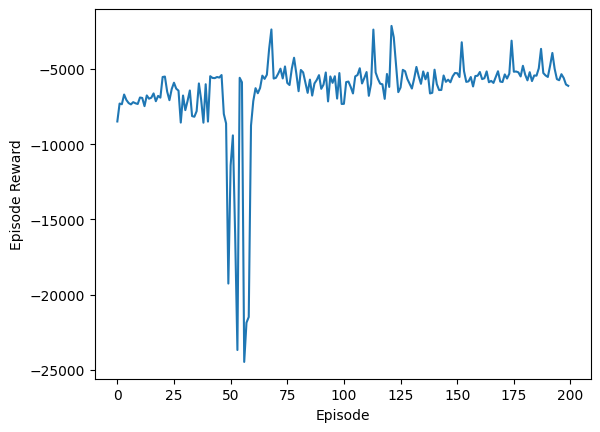

In [6]:
rewards, trained_agent = train_ddpg(num_episodes=200, explor_noise= 1.)

# 報酬の推移を可視化
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Episode Reward')
plt.show()            

In [7]:
torch.save(trained_agent.actor.state_dict(),'actor.pth') 
torch.save(trained_agent.critic.state_dict(),'critic.pth') 

In [56]:
env = Acrobot(max_torque=10., train=False)
env.reset(initial_state=np.array([-np.pi/2, 0, 0, 0]))
print(env._get_obs())
done = False
result = [[env._get_obs()[i].item() for i in range(4)]]
baseline = 0.8
K = env.LQR_gain()
for i in range(1200):
    s = env._get_obs()
    if np.linalg.norm(s-np.array([np.pi/2, 0, 0, 0])) > baseline:
        a = trained_agent.get_action(env._get_obs())
    else:
        print(f'{i*0.02}: LQR switched')
        a = - np.dot(K, s-np.array([np.pi/2, 0, 0, 0]))
    s_next, _, _, _ = env.step(a)
    result.append([s_next[i].item() for i in range(4)])
    

[-1.5707964  0.         0.         0.       ]
5.0600000000000005: LQR switched
5.1000000000000005: LQR switched
5.14: LQR switched
5.2: LQR switched
5.24: LQR switched
5.28: LQR switched
5.34: LQR switched
8.82: LQR switched
8.84: LQR switched
8.9: LQR switched
8.94: LQR switched
9.0: LQR switched
9.06: LQR switched
9.1: LQR switched
12.66: LQR switched
12.68: LQR switched
12.74: LQR switched
12.780000000000001: LQR switched
12.8: LQR switched
12.82: LQR switched
12.84: LQR switched
12.86: LQR switched
12.88: LQR switched
12.9: LQR switched
12.92: LQR switched
12.94: LQR switched
12.96: LQR switched
12.98: LQR switched
13.0: LQR switched
13.02: LQR switched
13.040000000000001: LQR switched
13.06: LQR switched
13.08: LQR switched
13.1: LQR switched
13.120000000000001: LQR switched
13.14: LQR switched
13.16: LQR switched
13.18: LQR switched
13.200000000000001: LQR switched
13.22: LQR switched
13.24: LQR switched
13.26: LQR switched
13.280000000000001: LQR switched
13.3: LQR switched
13.3

MovieWriter ffmpeg unavailable; using Pillow instead.


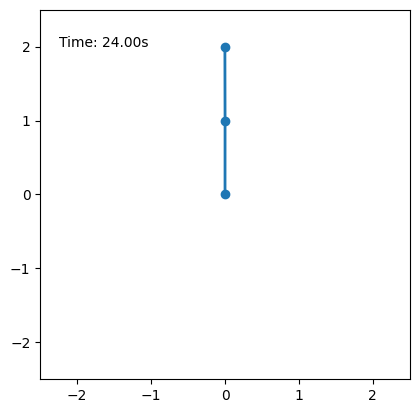

In [59]:
# アニメーションの準備
fig, ax = plt.subplots()
ax.set_xlim(-env.l1 - env.l2 - 0.5, env.l1 + env.l2 + 0.5)
ax.set_ylim(-env.l1 - env.l2 - 0.5, env.l1 + env.l2 + 0.5)
ax.set_aspect('equal')

line, = ax.plot([], [], 'o-', lw=2)
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)

def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text

def update(frame):
    q1, q2 = result[frame][0], result[frame][1]
    x, y = env._get_pos(q1, q2)
    line.set_data(x, y)
    time_text.set_text(f'Time: {env.dt*frame:.2f}s')
    return line, time_text

anim = FuncAnimation(fig, update, frames=len(result), init_func=init, blit=True, interval=30)
anim.save('final.gif')

HTML(anim.to_jshtml())

In [58]:
import pickle

with open('result_l2.pkl', mode='wb') as f:
    pickle.dump(result, f)